<a href="https://colab.research.google.com/github/CDFire/ProjectsInAI-ML/blob/main/HW5/ProjectsInAIML_HW5_Task2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Part 1

In [9]:
import tensorflow as tf
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt

In [43]:
(x_train, _), (x_test, _) = tf.keras.datasets.cifar10.load_data()
x_train = x_train.astype("float32") / 255.
x_test = x_test.astype("float32") / 255.

In [44]:
latent_dim = 64
batch_size = 128
epochs = 30

In [45]:
encoder_inputs = tf.keras.Input(shape=(32, 32, 3))
x = layers.Conv2D(32, 3, activation="relu", strides=2, padding="same")(encoder_inputs)
x = layers.Conv2D(64, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Flatten()(x)
x = layers.Dense(128, activation="relu")(x)
z_mean = layers.Dense(latent_dim, name="z_mean")(x)
z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)

In [46]:
def sampling(args):
    z_mean, z_log_var = args
    epsilon = tf.random.normal(shape=(tf.shape(z_mean)[0], latent_dim))
    return z_mean + tf.exp(0.5 * z_log_var) * epsilon

In [47]:
z = layers.Lambda(sampling, output_shape=(latent_dim,), name="z")([z_mean, z_log_var])
encoder = tf.keras.Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")
encoder.summary()

Model: "encoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_9             │ (None, 32, 32, 3)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_8 (Conv2D)         │ (None, 16, 16, 32)     │            896 │ input_layer_9[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_9 (Conv2D)         │ (None, 8, 8, 64)       │         18,496 │ conv2d_8[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_4 (Flatten)       │ (None, 4096)           │              0 │ conv2d_9[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_9 (Dense)           │ (None, 128)            │        524,416 │ flatten_4[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_mean (Dense)            │ (None, 64)             │          8,256 │ dense_9[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z_log_var (Dense)         │ (None, 64)             │          8,256 │ dense_9[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ z (Lambda)                │ (None, 64)             │              0 │ z_mean[0][0],          │
│                           │                        │                │ z_log_var[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 560,320 (2.14 MB)

 Trainable params: 560,320 (2.14 MB)

 Non-trainable params: 0 (0.00 B)

In [48]:
latent_inputs = tf.keras.Input(shape=(latent_dim,))
x = layers.Dense(8 * 8 * 64, activation="relu")(latent_inputs)
x = layers.Reshape((8, 8, 64))(x)
x = layers.Conv2DTranspose(64, 3, activation="relu", strides=2, padding="same")(x)   # (16,16,64)
x = layers.Conv2DTranspose(32, 3, activation="relu", strides=2, padding="same")(x)   # (32,32,32)
decoder_outputs = layers.Conv2DTranspose(3, 3, activation="sigmoid", padding="same")(x)
decoder = tf.keras.Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()

Model: "decoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_10 (InputLayer)          │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 4096)                │         266,240 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape_5 (Reshape)                  │ (None, 8, 8, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_15                  │ (None, 16, 16, 64)          │          36,928 │
│ (Conv2DTranspose)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_16                  │ (None, 32, 32, 32)          │          18,464 │
│ (Conv2DTranspose)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_17                  │ (None, 32, 32, 3)           │             867 │
│ (Conv2DTranspose)                    │                             │                 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 322,499 (1.23 MB)

 Trainable params: 322,499 (1.23 MB)

 Non-trainable params: 0 (0.00 B)

In [49]:
class VAE(tf.keras.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder

    def train_step(self, data):
        if isinstance(data, tuple):
            data = data[0]
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = self.encoder(data)
            reconstruction = self.decoder(z)
            reconstruction_loss = tf.reduce_mean(
                tf.reduce_sum(
                    tf.keras.losses.binary_crossentropy(data, reconstruction), axis=(1, 2)
                )
            )
            kl_loss = -0.5 * tf.reduce_mean(
                tf.reduce_sum(1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var), axis=1)
            )
            total_loss = reconstruction_loss + kl_loss
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        return {"loss": total_loss, "reconstruction_loss": reconstruction_loss, "kl_loss": kl_loss}

    def test_step(self, data):
        if isinstance(data, tuple):
            data = data[0]
        z_mean, z_log_var, z = self.encoder(data)
        reconstruction = self.decoder(z)
        reconstruction_loss = tf.reduce_mean(
            tf.reduce_sum(
                tf.keras.losses.binary_crossentropy(data, reconstruction), axis=(1, 2)
            )
        )
        kl_loss = -0.5 * tf.reduce_mean(
            tf.reduce_sum(1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var), axis=1)
        )
        total_loss = reconstruction_loss + kl_loss
        return {"loss": total_loss, "reconstruction_loss": reconstruction_loss, "kl_loss": kl_loss}

    def call(self, inputs):
        z_mean, z_log_var, z = self.encoder(inputs)
        return self.decoder(z)

In [50]:
vae = VAE(encoder, decoder)
vae.compile(optimizer=tf.keras.optimizers.Adam())

vae.fit(x_train, epochs=epochs, batch_size=batch_size, validation_data=(x_test, None))

Epoch 1/30
391/391 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - kl_loss: 6.1014 - loss: 672.9652 - reconstruction_loss: 666.8638 - val_kl_loss: 10.0791 - val_loss: 660.5665 - val_reconstruction_loss: 650.4874
Epoch 2/30
391/391 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - kl_loss: 10.3738 - loss: 648.4611 - reconstruction_loss: 638.0872 - val_kl_loss: 11.8853 - val_loss: 647.2953 - val_reconstruction_loss: 635.4100
Epoch 3/30
391/391 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - kl_loss: 11.7888 - loss: 638.4347 - reconstruction_loss: 626.6459 - val_kl_loss: 11.8204 - val_loss: 645.5876 - val_reconstruction_loss: 633.7672
Epoch 4/30
391/391 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - kl_loss: 11.9027 - loss: 636.0801 - reconstruction_loss: 624.1774 - val_kl_loss: 11.5453 - val_loss: 644.7985 - val_reconstruction_loss: 633.2532
Epoch 5/30
391/391 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - kl_loss: 11.9788 - loss: 635.0554 - reconstruction_loss: 623.0766 - val_kl_loss: 11.9729 - val_loss: 642.5269 - val_reconstruction_loss: 630.5540

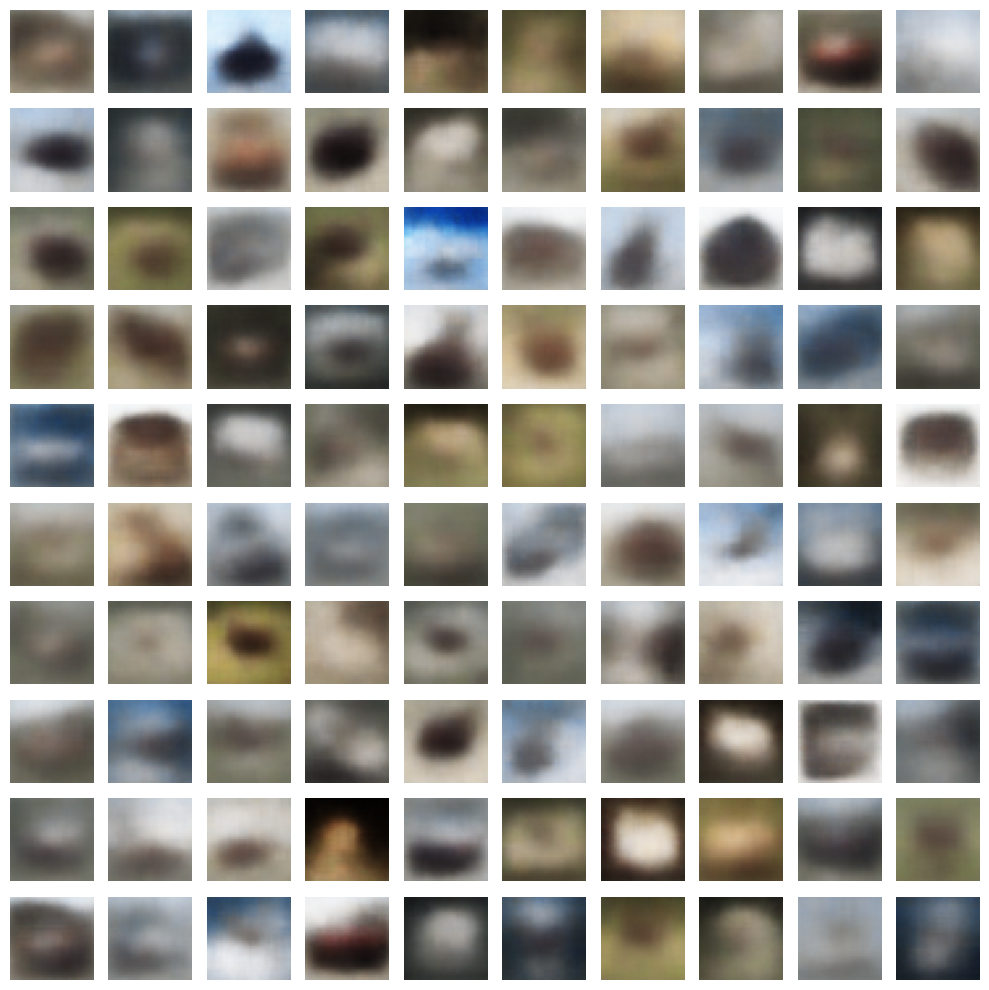

In [51]:
n=10

random_latent_vectors = tf.random.normal(shape=(n * n, latent_dim))
generated_images = decoder(random_latent_vectors)
generated_images = generated_images.numpy()

fig, axs = plt.subplots(n, n, figsize=(n, n))
idx = 0
for i in range(n):
    for j in range(n):
        axs[i, j].imshow(generated_images[idx])
        axs[i, j].axis('off')
        idx += 1
plt.tight_layout()
plt.show()

#Part 2

In [52]:
(x_train, _), (_, _) = tf.keras.datasets.cifar10.load_data()
x_train = x_train.astype('float32')
x_train = (x_train - 127.5) / 127.5

In [54]:
BUFFER_SIZE = x_train.shape[0]
BATCH_SIZE = 128

train_dataset = tf.data.Dataset.from_tensor_slices(x_train).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

In [55]:
noise_dim = 100
num_examples_to_generate = 16

def make_generator_model():
    model = tf.keras.Sequential(name="generator")
    model.add(layers.Dense(4 * 4 * 512, use_bias=False, input_shape=(noise_dim,)))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())
    model.add(layers.Reshape((4, 4, 512)))

    model.add(layers.Conv2DTranspose(256, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())

    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())

    model.add(layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    return model

generator = make_generator_model()
generator.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_11 (Dense)                     │ (None, 8192)                │         819,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 8192)                │          32,768 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu (ReLU)                         │ (None, 8192)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape_6 (Reshape)                  │ (None, 4, 4, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_18                  │ (None, 8, 8, 256)           │       3,276,800 │
│ (Conv2DTranspose)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 8, 8, 256)           │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_1 (ReLU)                       │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_19                  │ (None, 16, 16, 128)         │         819,200 │
│ (Conv2DTranspose)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_2 (ReLU)                       │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_20                  │ (None, 32, 32, 3)           │           9,600 │
│ (Conv2DTranspose)                    │                             │                 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,959,104 (18.92 MB)

 Trainable params: 4,941,952 (18.85 MB)

 Non-trainable params: 17,152 (67.00 KB)

In [56]:
def make_discriminator_model():
    model = tf.keras.Sequential(name="discriminator")
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same',
                            input_shape=[32, 32, 3]))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1))
    return model

discriminator = make_discriminator_model()
discriminator.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_10 (Conv2D)                   │ (None, 16, 16, 64)          │           4,864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu (LeakyReLU)              │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_11 (Conv2D)                   │ (None, 8, 8, 128)           │         204,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_1 (LeakyReLU)            │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_5 (Flatten)                  │ (None, 8192)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_12 (Dense)                     │ (None, 1)                   │           8,193 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 217,985 (851.50 KB)

 Trainable params: 217,985 (851.50 KB)

 Non-trainable params: 0 (0.00 B)

In [57]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    return real_loss + fake_loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)


In [58]:
EPOCHS = 50
seed = tf.random.normal([num_examples_to_generate, noise_dim])

@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss

def train(dataset, epochs):
    for epoch in range(epochs):
        print(f"Starting epoch {epoch+1}/{epochs}")
        for image_batch in dataset:
            g_loss, d_loss = train_step(image_batch)
        print(f"Epoch {epoch+1}, Generator Loss: {g_loss:.4f}, Discriminator Loss: {d_loss:.4f}")
        generate_and_save_images(generator, epoch+1, seed)

def generate_and_save_images(model, epoch, test_input):
    predictions = model(test_input, training=False)
    predictions = (predictions * 127.5 + 127.5).numpy().astype(np.uint8)

    fig = plt.figure(figsize=(4,4))
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        plt.imshow(predictions[i])
        plt.axis('off')
    plt.suptitle(f"Epoch {epoch}")
    plt.tight_layout()
    plt.show()

Starting epoch 1/50
Epoch 1, Generator Loss: 2.1004, Discriminator Loss: 0.3637


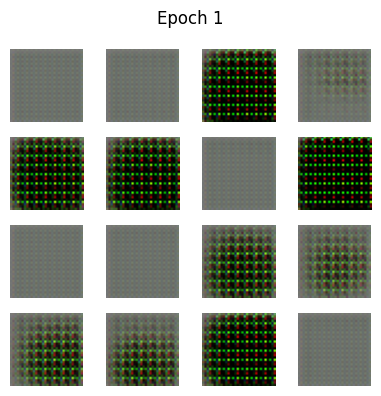

Starting epoch 2/50
Epoch 2, Generator Loss: 4.1045, Discriminator Loss: 0.6343


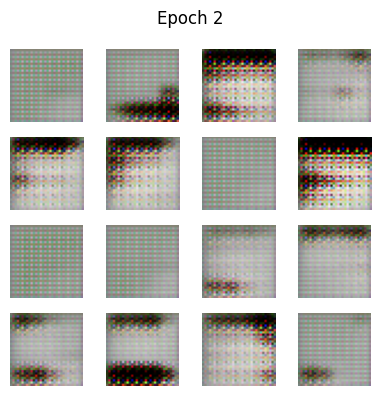

Starting epoch 3/50
Epoch 3, Generator Loss: 1.9215, Discriminator Loss: 0.5464


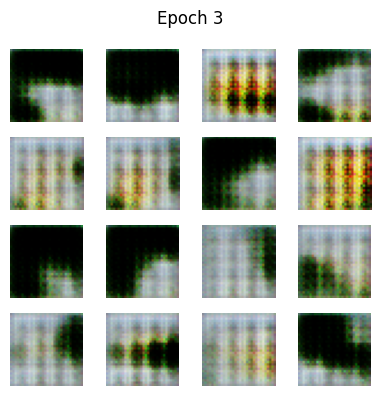

Starting epoch 4/50
Epoch 4, Generator Loss: 2.2469, Discriminator Loss: 0.6255


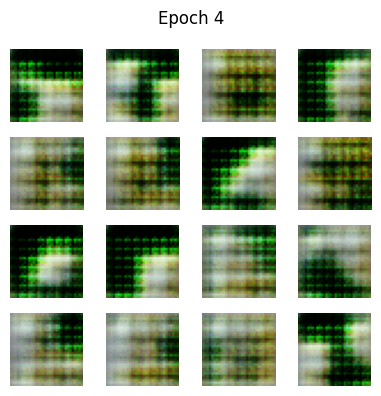

Starting epoch 5/50
Epoch 5, Generator Loss: 1.5160, Discriminator Loss: 1.3742


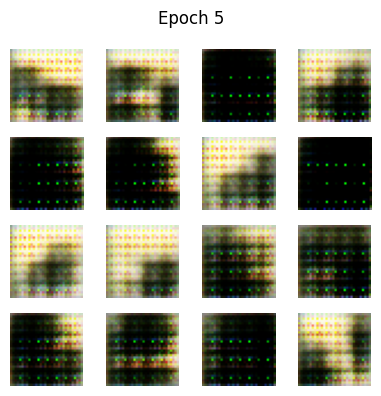

Starting epoch 6/50
Epoch 6, Generator Loss: 1.2517, Discriminator Loss: 1.1072


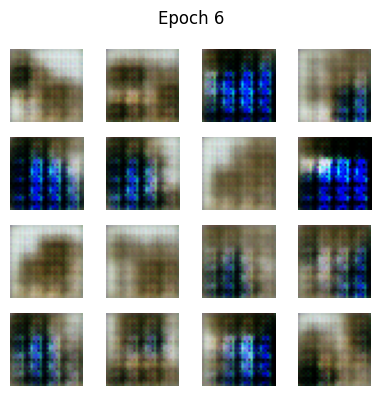

Starting epoch 7/50
Epoch 7, Generator Loss: 2.6116, Discriminator Loss: 0.3496


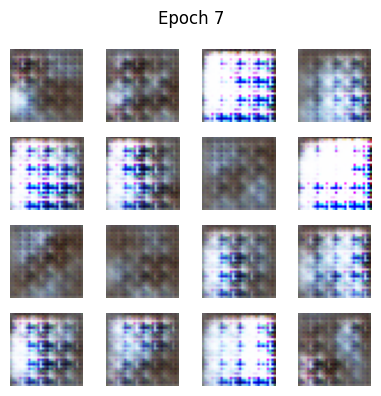

Starting epoch 8/50
Epoch 8, Generator Loss: 1.3127, Discriminator Loss: 0.8104


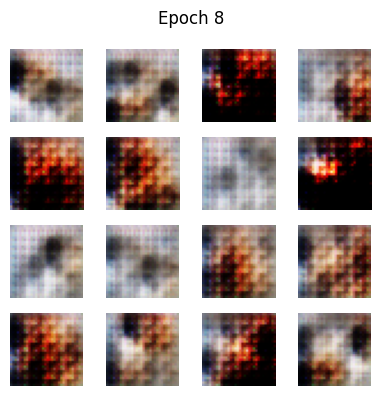

Starting epoch 9/50
Epoch 9, Generator Loss: 1.0081, Discriminator Loss: 1.1059


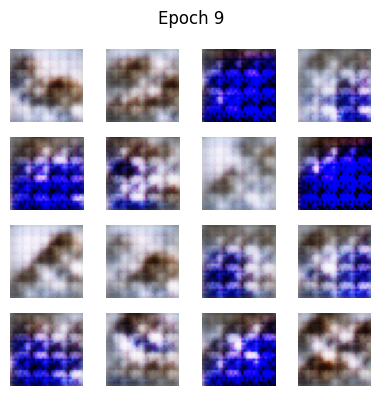

Starting epoch 10/50
Epoch 10, Generator Loss: 1.8500, Discriminator Loss: 0.5718


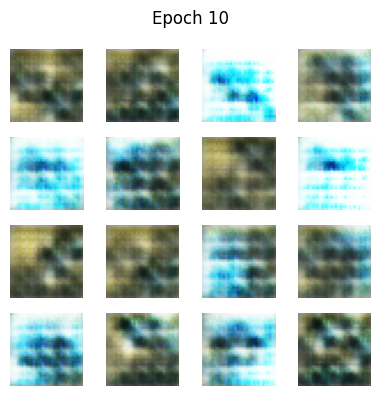

Starting epoch 11/50
Epoch 11, Generator Loss: 1.1872, Discriminator Loss: 1.3240


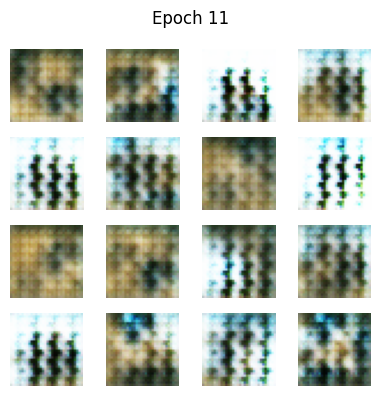

Starting epoch 12/50
Epoch 12, Generator Loss: 1.2239, Discriminator Loss: 1.2306


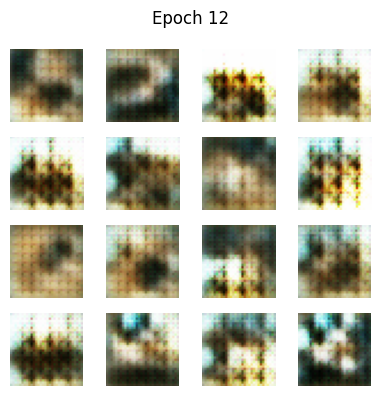

Starting epoch 13/50
Epoch 13, Generator Loss: 1.8202, Discriminator Loss: 0.7504


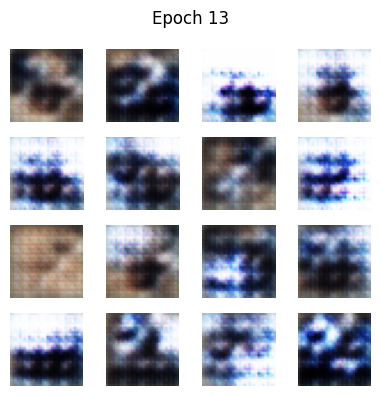

Starting epoch 14/50
Epoch 14, Generator Loss: 1.5199, Discriminator Loss: 0.9830


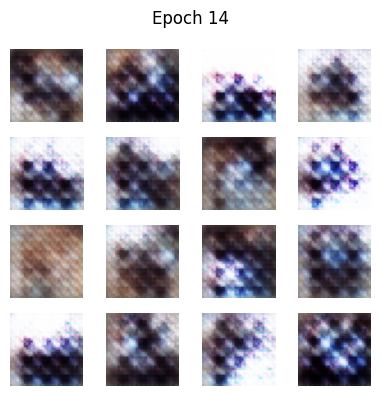

Starting epoch 15/50
Epoch 15, Generator Loss: 1.5165, Discriminator Loss: 0.9220


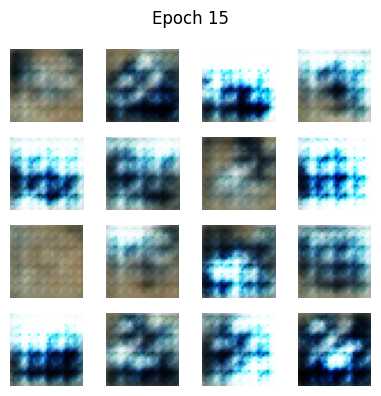

Starting epoch 16/50
Epoch 16, Generator Loss: 1.5975, Discriminator Loss: 0.6547


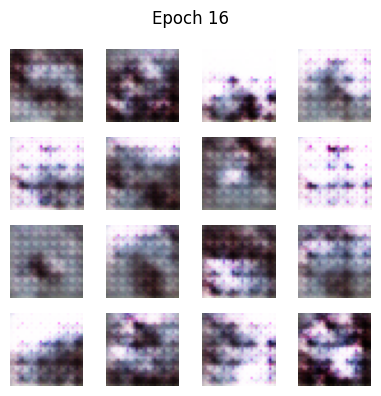

Starting epoch 17/50
Epoch 17, Generator Loss: 1.3878, Discriminator Loss: 0.9378


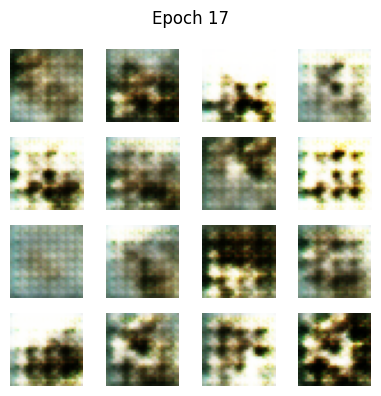

Starting epoch 18/50
Epoch 18, Generator Loss: 1.7689, Discriminator Loss: 0.6723


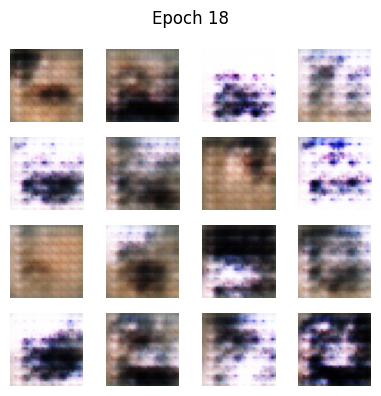

Starting epoch 19/50
Epoch 19, Generator Loss: 1.5486, Discriminator Loss: 0.8761


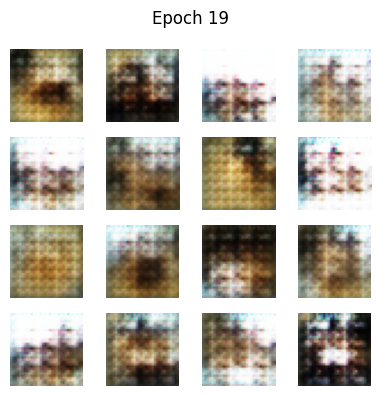

Starting epoch 20/50
Epoch 20, Generator Loss: 1.2818, Discriminator Loss: 1.2231


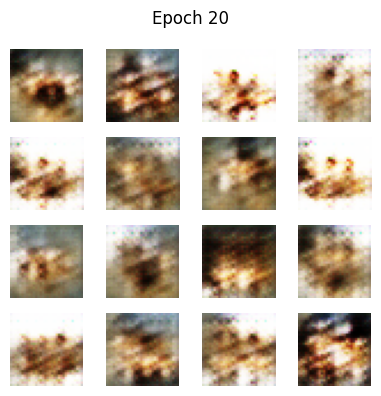

Starting epoch 21/50
Epoch 21, Generator Loss: 2.0604, Discriminator Loss: 0.8576


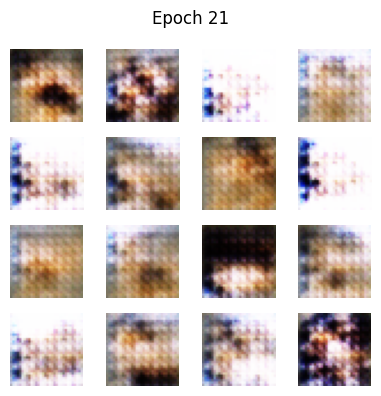

Starting epoch 22/50
Epoch 22, Generator Loss: 1.4266, Discriminator Loss: 1.2162


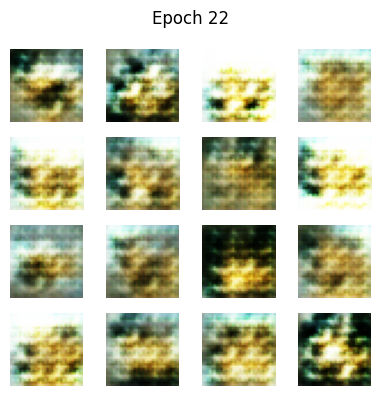

Starting epoch 23/50
Epoch 23, Generator Loss: 1.3458, Discriminator Loss: 0.8779


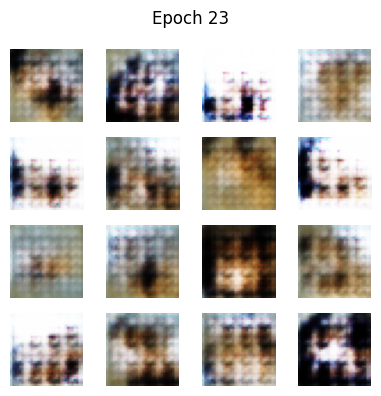

Starting epoch 24/50
Epoch 24, Generator Loss: 1.4369, Discriminator Loss: 1.0464


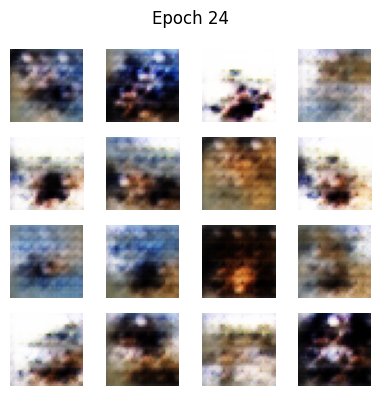

Starting epoch 25/50
Epoch 25, Generator Loss: 1.9662, Discriminator Loss: 0.5950


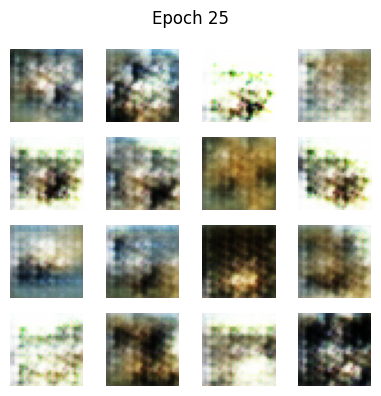

Starting epoch 26/50
Epoch 26, Generator Loss: 1.7938, Discriminator Loss: 0.6321


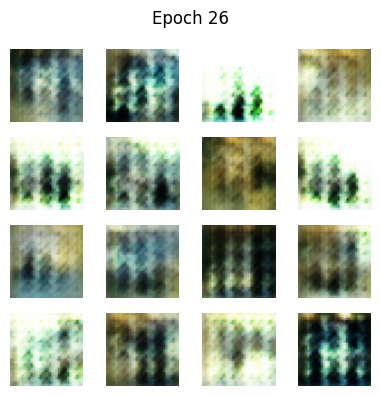

Starting epoch 27/50
Epoch 27, Generator Loss: 1.6822, Discriminator Loss: 0.9601


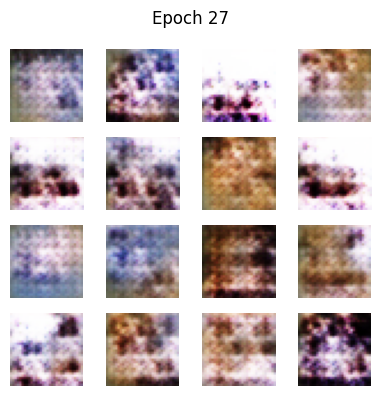

Starting epoch 28/50
Epoch 28, Generator Loss: 1.4170, Discriminator Loss: 1.0111


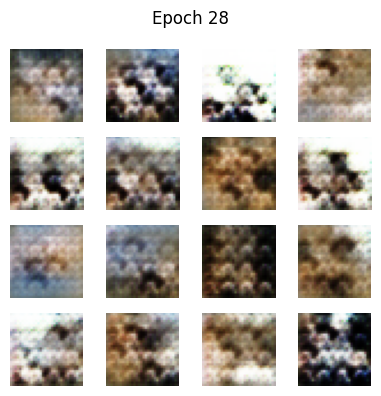

Starting epoch 29/50
Epoch 29, Generator Loss: 0.9581, Discriminator Loss: 1.3023


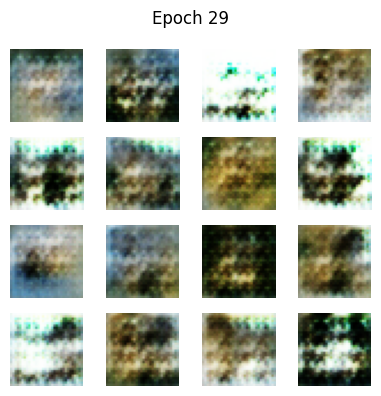

Starting epoch 30/50
Epoch 30, Generator Loss: 1.2641, Discriminator Loss: 1.1344


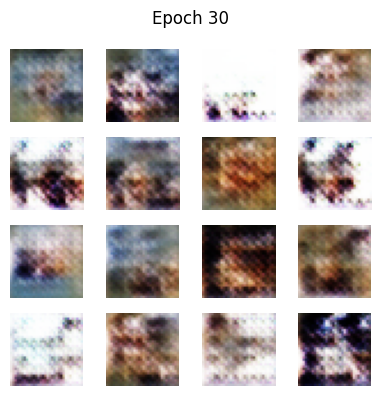

Starting epoch 31/50
Epoch 31, Generator Loss: 1.5243, Discriminator Loss: 0.8651


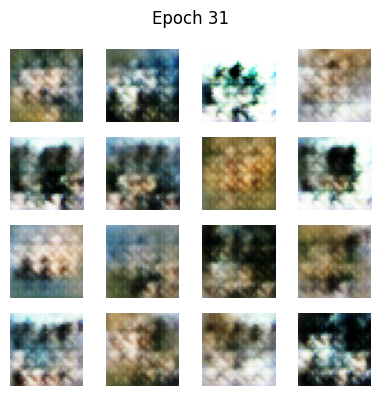

Starting epoch 32/50
Epoch 32, Generator Loss: 2.7401, Discriminator Loss: 0.6938


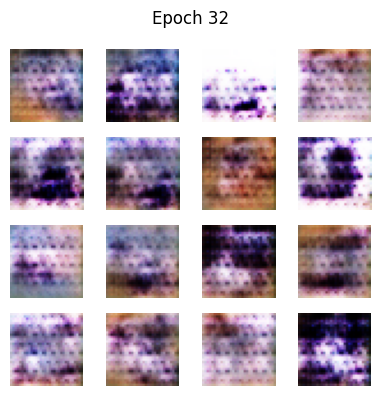

Starting epoch 33/50
Epoch 33, Generator Loss: 1.1424, Discriminator Loss: 1.1347


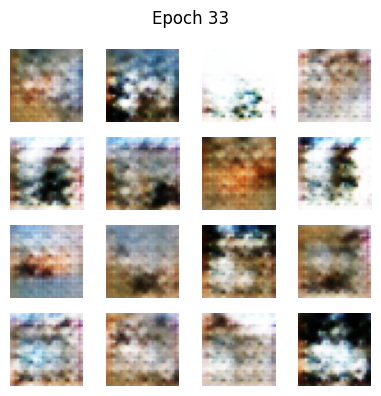

Starting epoch 34/50
Epoch 34, Generator Loss: 1.7662, Discriminator Loss: 0.9077


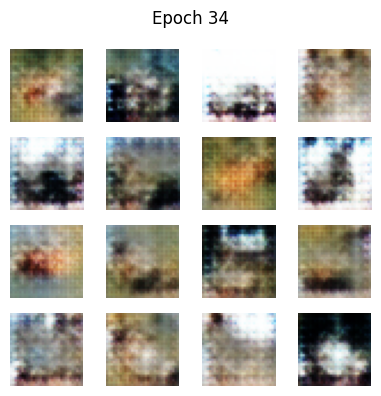

Starting epoch 35/50
Epoch 35, Generator Loss: 1.3876, Discriminator Loss: 1.1629


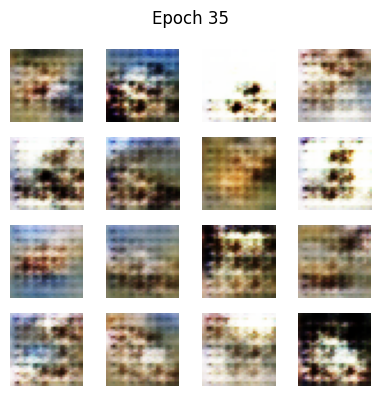

Starting epoch 36/50
Epoch 36, Generator Loss: 1.2574, Discriminator Loss: 0.9218


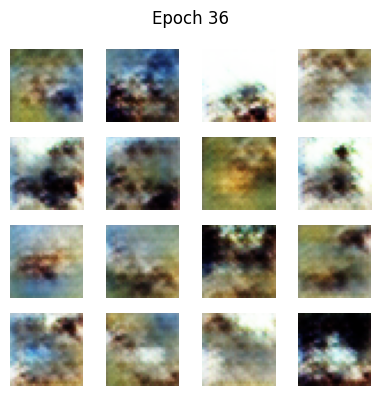

Starting epoch 37/50
Epoch 37, Generator Loss: 1.8032, Discriminator Loss: 1.2165


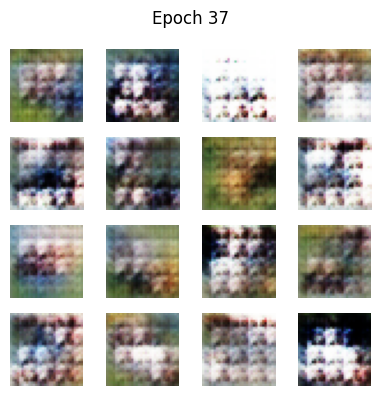

Starting epoch 38/50
Epoch 38, Generator Loss: 1.1182, Discriminator Loss: 1.2937


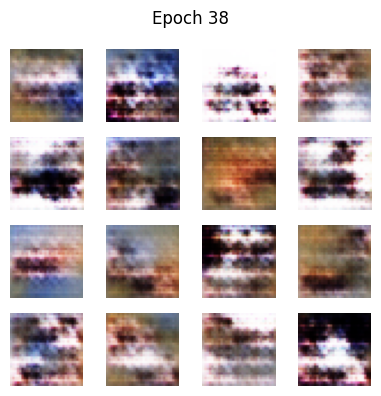

Starting epoch 39/50
Epoch 39, Generator Loss: 1.1103, Discriminator Loss: 1.1564


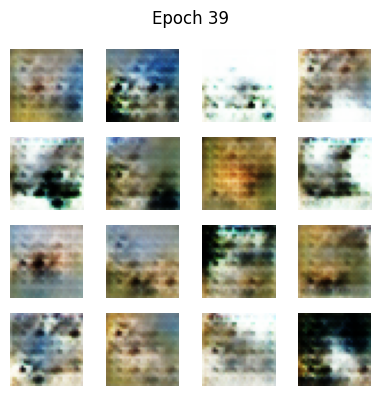

Starting epoch 40/50
Epoch 40, Generator Loss: 1.9068, Discriminator Loss: 0.6332


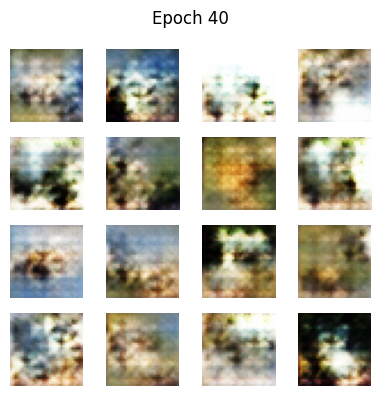

Starting epoch 41/50
Epoch 41, Generator Loss: 1.3584, Discriminator Loss: 0.9083


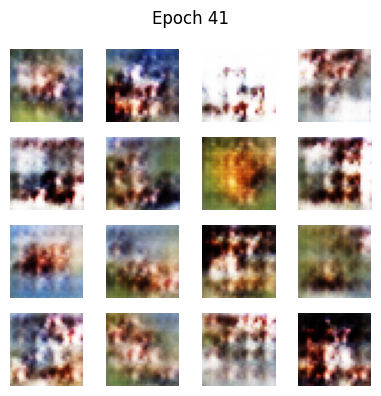

Starting epoch 42/50
Epoch 42, Generator Loss: 1.2766, Discriminator Loss: 1.3133


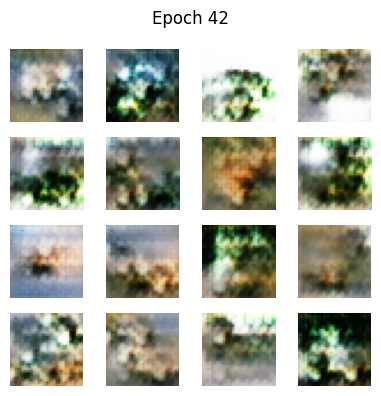

Starting epoch 43/50
Epoch 43, Generator Loss: 1.2438, Discriminator Loss: 1.1784


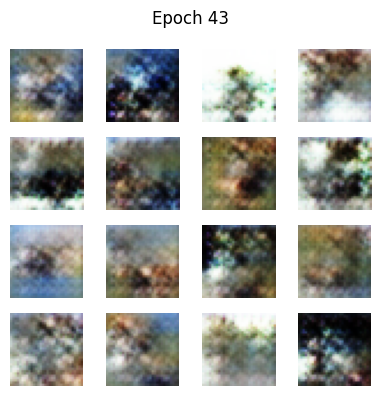

Starting epoch 44/50
Epoch 44, Generator Loss: 1.2822, Discriminator Loss: 0.9081


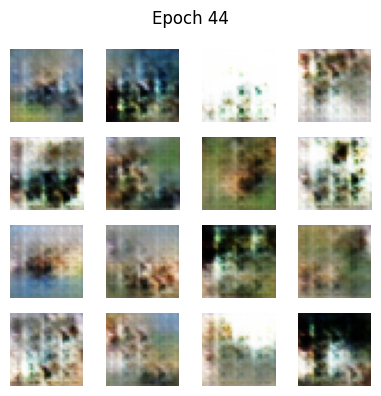

Starting epoch 45/50
Epoch 45, Generator Loss: 1.2989, Discriminator Loss: 0.9944


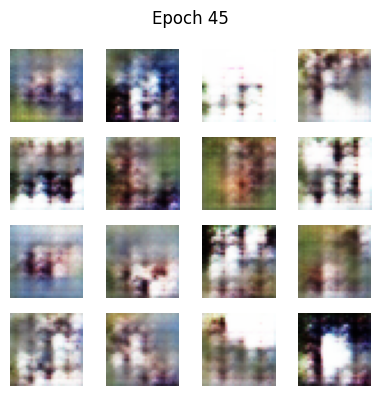

Starting epoch 46/50
Epoch 46, Generator Loss: 1.5405, Discriminator Loss: 1.0969


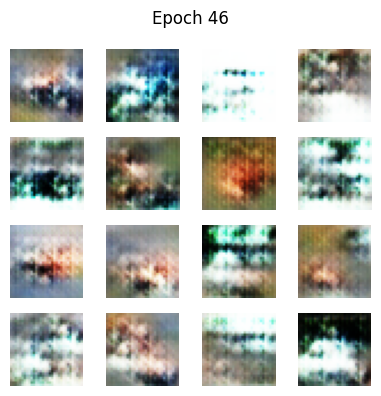

Starting epoch 47/50
Epoch 47, Generator Loss: 1.8262, Discriminator Loss: 0.8006


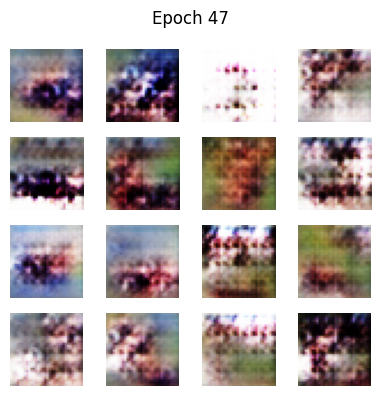

Starting epoch 48/50
Epoch 48, Generator Loss: 1.7384, Discriminator Loss: 0.7263


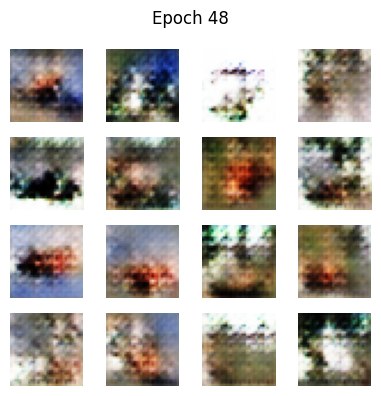

Starting epoch 49/50
Epoch 49, Generator Loss: 1.4849, Discriminator Loss: 0.8621


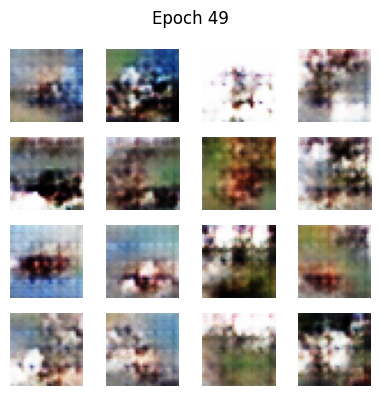

Starting epoch 50/50
Epoch 50, Generator Loss: 1.5778, Discriminator Loss: 0.8674


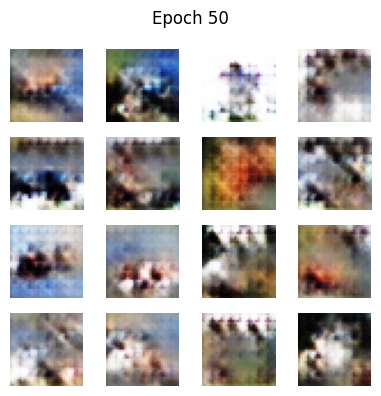

In [59]:
train(train_dataset, EPOCHS)